In [1]:
from time import sleep
import pickle
import os
import shutil
from collections import Counter
from threading import Thread
import queue
from tqdm.auto import tqdm
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics.pairwise import cosine_similarity
import plotly.graph_objects as go

from src.utils import load_model, get_dataloaders, load_images_in_folder, show_images, modify_keys, save_results, transforms
from src.center_loss import CenterLoss

In [2]:
lr = 0.0001
batch_size = 32
num_epochs = 80

TRAIN_PATH = '/mnt/hdd/1/imageData/train/russianDataCleanAdded'
TEST_PATH = '/mnt/hdd/1/imageData/index/russianDataCleanAdded'
num_classes = len(os.listdir(TRAIN_PATH))
        
state_path = 'state_centerloss.pkl'
model_name = 'centerloss'

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

center_loss = CenterLoss(num_classes, feat_dim=512, use_gpu=True)
datasets, dataloaders = get_dataloaders(TRAIN_PATH, TEST_PATH, batch_size)

alpha = 0.005

class CenterLossClassifier(nn.Module):
    def __init__(self):
        super(CenterLossClassifier, self).__init__()
        self.model = torchvision.models.resnet50(pretrained=True)
#         self.model = torch.hub.load('pytorch/vision:v0.5.0', 'wide_resnet50_2', pretrained=True)
        in_features = self.model.fc.in_features
        self.center_loss = CenterLoss(num_classes, feat_dim=512, use_gpu=True)
        self.model.fc = nn.Sequential(nn.Linear(in_features, 512), 
                                      nn.ReLU(), 
                                      nn.Dropout(0.4))
        self.linear = nn.Linear(512, num_classes)
        
        
    def __call__(self, x):
        features = self.model(x)
        return features, self.linear(features)
    
    def check_predictions(self, dataloader):
        ys = []
        pred = []
        with torch.no_grad():
            for x, y in tqdm(dataloader):
                _, output = self(x.to(device))
                pred.append(torch.argmax(output, dim=1))
                ys.extend(y)
        correct = {}
        pred = torch.cat(pred).cpu()

        for y, p in zip(ys, pred.cpu()):
            correct[y.item()] = correct.get(y.item(), np.array([0, 0])) + np.array([y == p, 1])
        return accuracy_score(ys, pred), correct
        
    def confusion_matrix(self, dataloader):
        ys = []
        pred = []
        with torch.no_grad():
            for x, y in dataloader:
                _, output = self(x.to(device))
                pred.append(torch.argmax(output, dim=1))
                ys.extend(y)
        return confusion_matrix(ys, torch.cat(pred).cpu())   
    
    def predictions_for_class(self, x):
        with torch.no_grad():
            _, output = self(x.to(device))
            return torch.sort(torch.softmax(output.cpu(), dim=1), dim=1)


cuda:0


In [3]:
epoch = 48
model2 = CenterLossClassifier()
model2 = load_model(model2, model_name, epoch) #'moredata_centerloss'
center_loss.load(epoch)
model2.eval();
# acc, correct = model2.check_predictions(dataloaders['test'])
# correct = modify_keys(correct, datasets['train'])

In [4]:
class LandmarksDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.landmarks = os.listdir(root_dir)

    def __len__(self):
        return len(self.landmarks)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir, self.landmarks[idx])
        image = Image.open(img_name).convert('RGB')
        label = self.landmarks[idx][1]
        image = transforms['val'](image)
        return image, img_name
    
def show(img, size=3, is_gray=False):
    plt.figure(figsize=(size,size))
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(img, cmap='gray' if is_gray else None)

In [5]:
from sklearn.cluster import AgglomerativeClustering

In [6]:
result = {}

In [7]:
different = 0
for directory in tqdm(os.listdir('/mnt/hdd/1/imageData/russianDataCleanAdded/')):
    path = '/mnt/hdd/1/imageData/russianDataCleanAdded/' + directory
    ds = LandmarksDataset(path)
    xs = DataLoader(ds, batch_size=batch_size)
    features = []
    
    if len(ds) < 50:
        result[directory] = [os.listdir(path)]
        continue
    
    for x, _ in xs:
        feats, _ = model2(x)
        features.append(feats.detach().cpu().numpy())
    
    features = np.concatenate(features, axis=0)
    clustering = AgglomerativeClustering(n_clusters=None, affinity="cosine", 
                                     linkage="complete", distance_threshold=0.27).fit(features)
    
    clusters = []
    i = 0
    while (clustering.labels_ == i).sum():
        cnt = (clustering.labels_ == i).sum()
        clusters.append((cnt, i))
        i += 1

    big = len(list(filter(lambda x: x[0] > 50, clusters)))
    if big == 0:
        result[directory] = [os.listdir(path)]
        continue

    different += 1
    files = []
    labels = np.array(clustering.labels_)
    for cnt, label in clusters:
        if cnt > 50:
            files.append([])
            for i in range(len(ds)):
                if labels[i] == label:
                    files[-1].append(ds[i][1])
    result[directory] = files

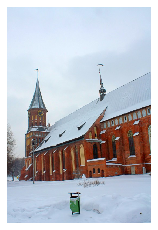

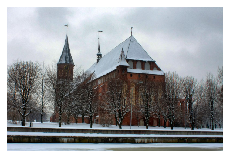

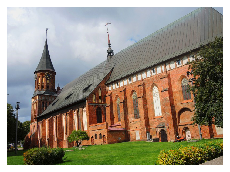

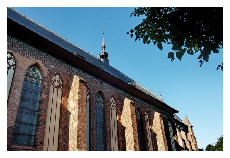

In [8]:
for i, label in enumerate(clustering.labels_):
    if label == 4:
        show(Image.open(ds[i][1]))

In [9]:
len(result)

1019

In [11]:
import json
with open('clusters.json', 'w') as f:
    json.dump(result, f)

In [12]:
result

{'309': [['/mnt/hdd/1/imageData/russianDataCleanAdded/309/e5cb053a4dc7e076.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/e2901dce5731734e.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/c4978d25b7983513.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/ae1bcc9dc55220fe.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/daa94827520959c8.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/93e6bb75b64e18bf.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/ed6163c11e74c3a9.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/ffdc370f71754d88.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/5ba509a83a14aad4.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/a4930cf349066493.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/d2f45d974126cfa3.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/16d53f0e9ba0d8d6.jpg',
   '/mnt/hdd/1/imageData/russianDataCleanAdded/309/2403752aca76ad33.jpg',
   '/mnt/hdd/1/imageData/russia

In [13]:
different

533